## Train custom instance segmentation model using Detectron2 - on your own dataset

**Install Detectron2**

In [1]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 4.8 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15725, done.
remote: Counting objects: 100% (448/448), done.
remote: Compressing objects: 100% (336/336), done.
remote: Total 15725 (delta 201), reused 302 (delta 103), pack-reused 15277
Receiving objects: 100% (15725/15725), 6.51 MiB | 11.54 MiB/s, done.
Resolving deltas: 100% (11313/11313), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 3.0 MB/s eta 0:0

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.3 ; cuda:  cu121
detectron2: 0.6


In [3]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

To verify if Detectron2 is working correctly, we can load a pre-trained model and run it on a natural image. Here's how you can do it:

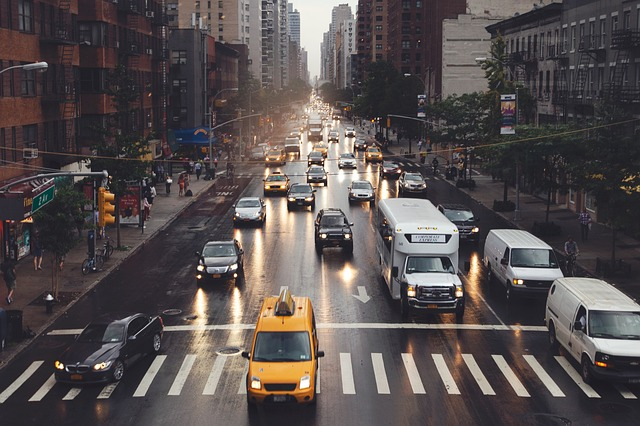

In [42]:
im = cv2.imread("/content/drive/MyDrive/projects/eye segmentation/data/traffic.jpg")
cv2_imshow(im)

We create a detectron2 config and a detectron2 DefaultPredictor to run inference on this image.

In [43]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo.  https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

[06/06 05:19:35 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


In [44]:
# look at the outputs - tensors and bounding boxes.
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([2, 2, 2, 2, 2, 9, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 7, 7, 2, 0,
        0, 2, 1, 2, 2, 2], device='cuda:0')
Boxes(tensor([[397.4508, 171.4251, 426.9473, 196.8334],
        [233.1769, 196.2425, 265.6344, 226.0624],
        [196.0380, 240.3691, 243.7754, 282.5593],
        [348.2554, 180.3125, 374.6449, 202.0204],
        [312.7214, 209.1358, 353.8081, 253.9366],
        [ 98.6085, 188.0201, 116.4763, 228.4129],
        [564.1293, 234.8363, 579.3315, 276.8935],
        [194.6755, 160.8019, 201.5359, 180.6131],
        [285.8160, 183.4618, 316.0012, 211.6310],
        [438.6341, 203.8863, 479.9939, 243.3936],
        [263.3474, 172.6026, 290.0517, 195.0702],
        [364.8832, 145.4471, 383.5930, 164.0436],
        [305.5451, 164.3380, 327.9097, 185.2074],
        [ 53.4760, 312.1726, 162.5587, 389.0571],
        [544.5247, 271.3843, 637.8619, 392.0739],
        [177.7533, 172.0853, 184.8223, 195.8293],
        [482.0780, 230.3776, 564.5102, 307.7957],
        [164.9485, 1

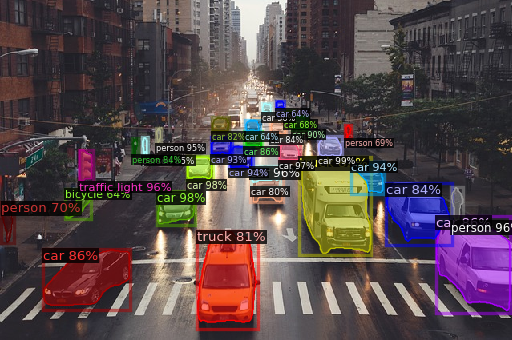

In [45]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.8)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

# Train on a custom dataset

To register datasets in the COCO format using Detectron2, you need to import the necessary functions and register both the training and validation datasets. Here’s how you can do it:

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/drive/MyDrive/projects/eye segmentation/data/train/labels_my-project-name_2024-06-06-09-43-22.json", "/content/drive/MyDrive/projects/eye segmentation/data/train")
register_coco_instances("my_dataset_val", {}, "/content/drive/MyDrive/projects/eye segmentation/data/val/labels_my-project-name_2024-06-06-09-51-28.json", "/content/drive/MyDrive/projects/eye segmentation/data/val")



Let us extract the metadata and dataset dictionaries for both training and validation datasets. These can be used later for other purposes, like visualization, model training, evaluation, etc. We will see a visualization example right away.

In [6]:
train_metadata = MetadataCatalog.get("my_dataset_train")
train_dataset_dicts = DatasetCatalog.get("my_dataset_train")

[06/06 04:42:21 d2.data.datasets.coco]: Loading /content/drive/MyDrive/projects/eye segmentation/data/train/labels_my-project-name_2024-06-06-09-43-22.json takes 1.75 seconds.
[06/06 04:42:21 d2.data.datasets.coco]: Loaded 13 images in COCO format from /content/drive/MyDrive/projects/eye segmentation/data/train/labels_my-project-name_2024-06-06-09-43-22.json


In [7]:
val_metadata = MetadataCatalog.get("my_dataset_val")
val_dataset_dicts = DatasetCatalog.get("my_dataset_val")


[06/06 04:42:21 d2.data.datasets.coco]: Loaded 8 images in COCO format from /content/drive/MyDrive/projects/eye segmentation/data/val/labels_my-project-name_2024-06-06-09-51-28.json


In [8]:
from matplotlib import pyplot as plt

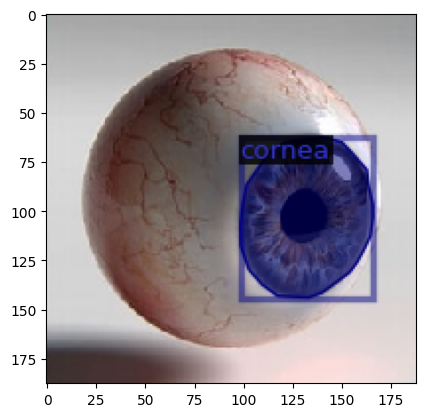

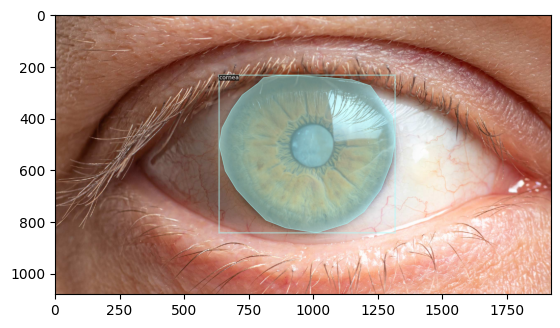

In [46]:
import random
import cv2
from matplotlib import pyplot as plt
from detectron2.utils.visualizer import Visualizer

# Assuming train_dataset_dicts and train_metadata are already defined

for d in random.sample(train_dataset_dicts, 2):
    img = cv2.imread(d["file_name"])
    # Convert BGR image to RGB
    img_rgb = img[:, :, ::-1]
    visualizer = Visualizer(img_rgb, metadata=train_metadata, scale=0.8)
    vis = visualizer.draw_dataset_dict(d)
    # vis.get_image() returns RGB image, no need to convert again
    plt.imshow(vis.get_image())
    plt.show()


# Train

Now we are ready to train a Mask R-CNN model using the Detectron2 library. We start by setting up a configuration file (.cfg) for the model. The configuration file contains many details including the output directory path, training dataset information, pre-trained weights, base learning rate, maximum number of iterations, etc.

In [18]:
import os
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.data import DatasetMapper, build_detection_train_loader
from detectron2.data import transforms as T

# Configuration setup
cfg = get_cfg()
cfg.OUTPUT_DIR = "/content/drive/MyDrive/projects/eye segmentation/models/Detectron2_Models"
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 1000    # 1000 iterations seems good enough for this dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # Default is 512, using 256 for this dataset.
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4  # We have 4 classes.
# NOTE: this config means the number of classes, without the background. Do not use num_classes+1 here.

class MyTrainer(DefaultTrainer):

    @classmethod
    def build_train_loader(cls, cfg):
        augmentations = [
            T.Resize((800, 800)),
            T.RandomFlip(prob=0.5, horizontal=True, vertical=False),
            T.RandomFlip(prob=0.5, horizontal=False, vertical=True),
            T.RandomRotation(angle=[-30, 30]),
            T.RandomBrightness(0.8, 1.2),
            T.RandomContrast(0.8, 1.2)
        ]
        mapper = DatasetMapper(cfg, is_train=True, augmentations=augmentations)
        return build_detection_train_loader(cfg, mapper=mapper)

# Create output directory if it does not exist
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# Create an instance of MyTrainer with the given configuration
trainer = MyTrainer(cfg)

# Load a pretrained model if available (resume training) or start training from scratch if no pretrained model is available
trainer.resume_or_load(resume=False)

# Start the training process
trainer.train()


[06/06 04:50:53 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[06/06 04:50:54 d2.engine.train_loop]: Starting training from iteration 0


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.10/dist-packages/fvcore/transforms/transform.py:434: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  tensor = torch.from_numpy(np.ascontiguousarray(img))
/usr/local/lib/python3.10/dist-packages/fvcore/transforms/transform.py:434: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will resu

[06/06 04:51:05 d2.utils.events]:  eta: 0:09:51  iter: 19  total_loss: 2.74  loss_cls: 1.735  loss_box_reg: 0.2546  loss_mask: 0.6898  loss_rpn_cls: 0.02068  loss_rpn_loc: 0.02213    time: 0.5709  last_time: 0.5767  data_time: 0.0222  last_data_time: 0.0115   lr: 4.9953e-06  max_mem: 5370M
[06/06 04:51:18 d2.utils.events]:  eta: 0:09:38  iter: 39  total_loss: 2.537  loss_cls: 1.526  loss_box_reg: 0.2756  loss_mask: 0.6826  loss_rpn_cls: 0.02075  loss_rpn_loc: 0.03282    time: 0.5878  last_time: 0.5698  data_time: 0.0120  last_data_time: 0.0057   lr: 9.9902e-06  max_mem: 5372M
[06/06 04:51:29 d2.utils.events]:  eta: 0:09:33  iter: 59  total_loss: 2.233  loss_cls: 1.129  loss_box_reg: 0.2832  loss_mask: 0.6756  loss_rpn_cls: 0.02792  loss_rpn_loc: 0.04149    time: 0.5907  last_time: 0.4819  data_time: 0.0111  last_data_time: 0.0069   lr: 1.4985e-05  max_mem: 5372M
[06/06 04:51:42 d2.utils.events]:  eta: 0:09:24  iter: 79  total_loss: 1.751  loss_cls: 0.7246  loss_box_reg: 0.2741  loss_ma

Train

Save the config file, for potential future use

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [19]:
import yaml
# Save the configuration to a config.yaml file
# Save the configuration to a config.yaml file
config_yaml_path = "/content/drive/MyDrive/projects/eye segmentation/models/Detectron2_Models/config.yaml"
with open(config_yaml_path, 'w') as file:
    yaml.dump(cfg, file)

# Inference & evaluation using the trained model

In [20]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[06/06 05:01:15 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/projects/eye segmentation/models/Detectron2_Models/model_final.pth ...


Verify segmentation on random validation images

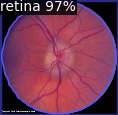

In [21]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(val_dataset_dicts, 1):    #select number of images for display
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

Check average precision and recall. (Need more validation data than just 2 images with handful of annotations)

In [22]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[06/06 05:01:29 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
[06/06 05:01:29 d2.data.datasets.coco]: Loaded 8 images in COCO format from /content/drive/MyDrive/projects/eye segmentation/data/val/labels_my-project-name_2024-06-06-09-51-28.json
[06/06 05:01:29 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[06/06 05:01:29 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[06/06 05:01:29 d2.data.common]: Serializing 8 elements to byte tensors and concatenating them all ...
[06/06 05:01:29 d2.data.common]: Serialized dataset takes 0.01 MiB
[06/06 05:01:29 d2.evaluation.evaluator]: Start inference on 8 batches


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[06/06 05:01:30 d2.evaluation.evaluator]: Total inference time: 0:00:00.296219 (0.098740 s / iter per device, on 1 devices)
[06/06 05:01:30 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.080971 s / iter per device, on 1 devices)
[06/06 05:01:30 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[06/06 05:01:30 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[06/06 05:01:30 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.328
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.656
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.281
 Average

**Load a new image and segment it.**

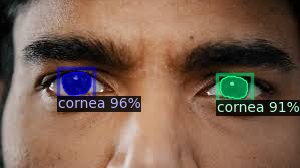

In [24]:
new_im = cv2.imread("/content/drive/MyDrive/projects/eye segmentation/data/test/men3.jpg")
outputs  = predictor(new_im)
img_rgb = new_im[:, :, ::-1]
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(img_rgb, metadata=train_metadata)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

cv2_imshow(out.get_image()[:, :, ::-1])


**Process multiple images in a directory and save the results in an output directory**

In [31]:
# Directory path to the input images folder
input_images_directory = "/content/drive/MyDrive/projects/eye segmentation/data/test"

# Output directory where the segmented images will be saved
output_directory = "/content/drive/MyDrive/projects/eye segmentation/data/test_results"  # Replace this with the path to your desired output directory

# Loop over the images in the input folder
for image_filename in os.listdir(input_images_directory):
    image_path = os.path.join(input_images_directory, image_filename)
    new_im = cv2.imread(image_path)
    print(image_path)
    # Perform prediction on the new image
    outputs = predictor(new_im)  # Format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

    # We can use `Visualizer` to draw the predictions on the image.
    v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # Create the output filename with _result extension
    result_filename = os.path.splitext(image_filename)[0] + "_result.png"
    output_path = os.path.join(output_directory, result_filename)

    # Save the segmented image
    cv2.imwrite(output_path, out.get_image()[:, :, ::-1])

print("Segmentation of all images completed.")

/content/drive/MyDrive/projects/eye segmentation/data/test/s1d.jpg
/content/drive/MyDrive/projects/eye segmentation/data/test/2ae8b169-012c-40ce-8963-799252637a2a.jpg
/content/drive/MyDrive/projects/eye segmentation/data/test/men3.jpg
Segmentation of all images completed.



**Segment images and save object level information into a csv file.**




In [32]:
import csv
from skimage.measure import regionprops, label


# Assuming you have already defined the 'predictor' object and loaded the model.
# Also, make sure 'metadata' is defined appropriately.

# Directory path to the input images folder
input_images_directory = "/content/drive/MyDrive/projects/eye segmentation/data/test"

# Output directory where the CSV file will be saved
output_csv_path = "/content/drive/MyDrive/projects/eye segmentation/data/test_results/output_objects.csv"  # Replace this with the path to your desired output CSV file

# Open the CSV file for writing
with open(output_csv_path, 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)

    # Write the header row in the CSV file
    csvwriter.writerow(["File Name", "Class Name", "Object Number", "Area", "Centroid", "BoundingBox"])  # Add more columns as needed for other properties

    # Loop over the images in the input folder
    for image_filename in os.listdir(input_images_directory):
        image_path = os.path.join(input_images_directory, image_filename)
        new_im = cv2.imread(image_path)

        # Perform prediction on the new image
        outputs = predictor(new_im)  # Format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

        # Convert the predicted mask to a binary mask
        mask = outputs["instances"].pred_masks.to("cpu").numpy().astype(bool)

        # Get the predicted class labels
        class_labels = outputs["instances"].pred_classes.to("cpu").numpy()

        # Debugging: print class_labels and metadata.thing_classes
        #print("Class Labels:", class_labels)
        #print("Thing Classes:", train_metadata.thing_classes)

        # Use skimage.measure.regionprops to calculate object parameters
        labeled_mask = label(mask)
        props = regionprops(labeled_mask)

        # Write the object-level information to the CSV file
        for i, prop in enumerate(props):
            object_number = i + 1  # Object number starts from 1
            area = prop.area
            centroid = prop.centroid
            bounding_box = prop.bbox

            # Check if the corresponding class label exists
            if i < len(class_labels):
                class_label = class_labels[i]
                class_name = train_metadata.thing_classes[class_label]
            else:
                # If class label is not available (should not happen), use 'Unknown' as class name
                class_name = 'Unknown'

            # Write the object-level information to the CSV file
            csvwriter.writerow([image_filename, class_name, object_number, area, centroid, bounding_box])  # Add more columns as needed for other properties

print("Object-level information saved to CSV file.")


Object-level information saved to CSV file.


In [41]:
import pandas as pd


# Path to the CSV file containing the object-level information
csv_file_path = "/content/drive/MyDrive/projects/eye segmentation/data/test_results/output_objects.csv"  # Update with your CSV file path

df = pd.read_csv(csv_file_path)
df.head()

,File Name,Class Name,Object Number,Area,Centroid,BoundingBox
0,s1d.jpg,retina,1,45853,"(0.03711861819292086, 128.77584890846836, 199....","(0, 12, 79, 2, 248, 318)"
1,2ae8b169-012c-40ce-8963-799252637a2a.jpg,cornea,1,30131,"(0.0, 536.2082240881484, 310.0273804387508)","(0, 463, 179, 1, 610, 439)"
2,2ae8b169-012c-40ce-8963-799252637a2a.jpg,cornea,2,15464,"(1.0, 540.2390713916193, 1161.0779229177444)","(1, 482, 1083, 2, 606, 1239)"
3,men3.jpg,cornea,1,548,"(0.0, 82.77189781021897, 76.06934306569343)","(0, 72, 62, 1, 95, 91)"
4,men3.jpg,cornea,2,539,"(1.0, 86.95547309833024, 233.5064935064935)","(1, 76, 220, 2, 99, 248)"


**Generate plots to understand the objects**

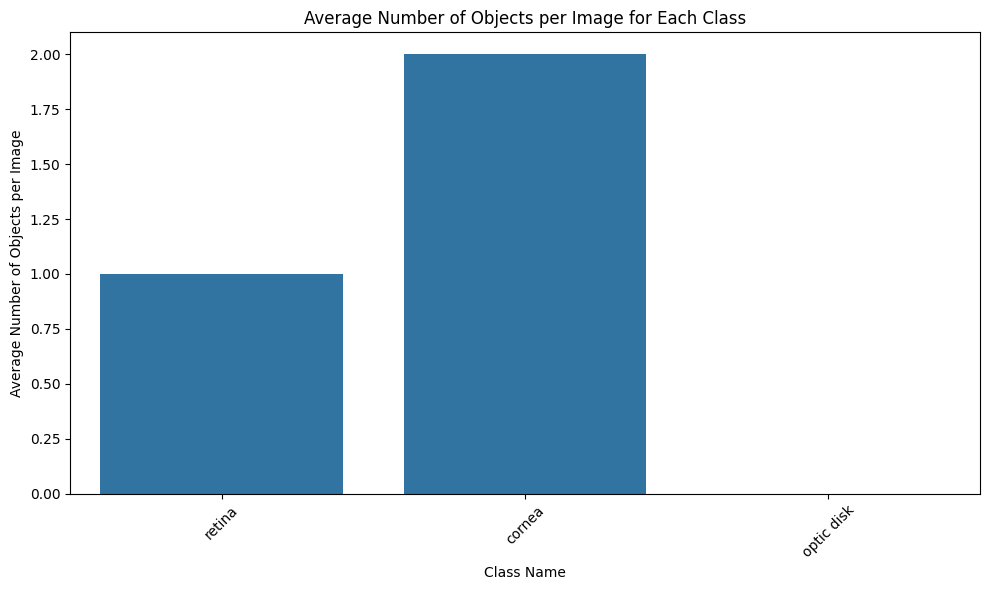

<ipython-input-34-e0b80c50ce8e>:36: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x="Class Name", y="Area", data=avg_area_per_class, ci=None, order=class_names)


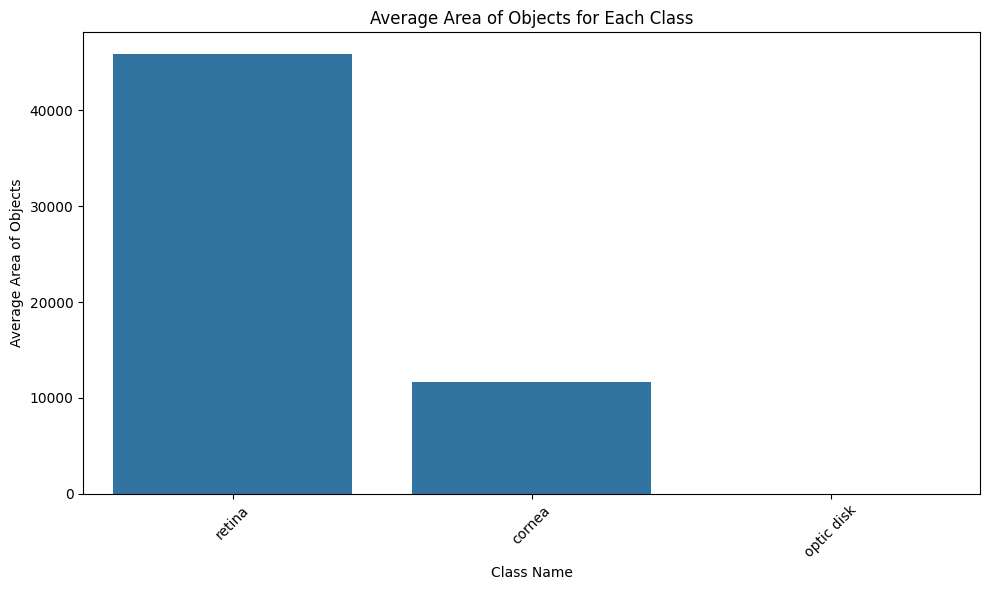

In [34]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Path to the CSV file containing the object-level information
csv_file_path = "/content/drive/MyDrive/projects/eye segmentation/data/test_results/output_objects.csv"  # Update with your CSV file path

# Load the CSV file into a pandas DataFrame
df = pd.read_csv(csv_file_path)

# Get class names from train_metadata.thing_classes
class_names = train_metadata.thing_classes

# Group the data by both "File Name" and "Class Name" and calculate the average number of objects per image for each class
# first group the data by both "File Name" and "Class Name" and count the number of objects within each group.
#Then, group the data by "Class Name" only and calculate the mean of the counts, which gives us the average number of objects per image for each class.
avg_objects_per_class = df.groupby(["File Name", "Class Name"])["Object Number"].count().reset_index()
avg_objects_per_class = avg_objects_per_class.groupby("Class Name")["Object Number"].mean().reset_index()

# Plot: Average number of objects per image for each class
plt.figure(figsize=(10, 6))
sns.barplot(x="Class Name", y="Object Number", data=avg_objects_per_class, errorbar=None, order=class_names)
plt.xticks(rotation=45)
plt.xlabel("Class Name")
plt.ylabel("Average Number of Objects per Image")
plt.title("Average Number of Objects per Image for Each Class")
plt.tight_layout()
plt.show()


# Group the data by class and calculate the average area of objects for each class
avg_area_per_class = df.groupby("Class Name")["Area"].mean().reset_index()

# Plot: Average area of objects for each class
plt.figure(figsize=(10, 6))
sns.barplot(x="Class Name", y="Area", data=avg_area_per_class, errorbar=None, order=class_names)
plt.xticks(rotation=45)
plt.xlabel("Class Name")
plt.ylabel("Average Area of Objects")
plt.title("Average Area of Objects for Each Class")
plt.tight_layout()
plt.show()


